<a href="https://colab.research.google.com/github/vdcmathieu/large_scale_machine_learning_and_data_mining/blob/main/tprl_lsml_2022_mv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install dependencies (run only once)

In [1]:
!git clone https://github.com/telejesus2/tprl-lsml-2022.git
%load tprl-lsml-2022/agents/common_all.py
import sys
sys.path.insert(0,'/content/tprl-lsml-2022')
!pip install pybullet
!pip install gym==0.18.0
!pip install box2d-py

Cloning into 'tprl-lsml-2022'...
remote: Enumerating objects: 95, done.
remote: Counting objects: 100% (95/95), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 95 (delta 33), reused 47 (delta 19), pack-reused 0
Unpacking objects: 100% (95/95), done.
     |████████████████████████████████| 90.8 MB 186 bytes/s 
     |████████████████████████████████| 1.6 MB 5.3 MB/s 
  Created wheel for gym: filename=gym-0.18.0-py3-none-any.whl size=1656447 sha256=223b7b6a92eb2e2587ff8d4970273d00d275470caed004fc9015f1083b25924b
  Stored in directory: /root/.cache/pip/wheels/99/f7/e3/d6f0f120ac047c1e5de2ae34930e7bf6e8de1c7a4d5fa68555
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.17.3
    Uninstalling gym-0.17.3:
      Successfully uninstalled gym-0.17.3
     |████████████████████████████████| 448 kB 5.3 MB/s 


In [2]:
!apt-get install swig cmake libopenmpi-dev zlib1g-dev xvfb x11-utils ffmpeg -qq 

from natsort import natsorted
from pathlib import Path
import base64
from IPython import display as ipythondisplay

# Set up fake display; otherwise rendering will fail
import os
os.system("Xvfb :1 -screen 0 1024x768x24 &")
os.environ['DISPLAY'] = ':1'

# Display video
def show_videos(video_path='', prefix=''):
  html = []
  for mp4 in natsorted(Path(video_path).glob("{}*.mp4".format(prefix))):
      video_b64 = base64.b64encode(mp4.read_bytes())
      html.append('''<video alt="{}" autoplay 
                    loop controls style="height: 400px;">
                    <source src="data:video/mp4;base64,{}" type="video/mp4" />
                </video>'''.format(mp4, video_b64.decode('ascii')))
  ipythondisplay.display(ipythondisplay.HTML(data="<br>".join(html)))

Selecting previously unselected package libxxf86dga1:amd64.
(Reading database ... 155332 files and directories currently installed.)
Preparing to unpack .../libxxf86dga1_2%3a1.1.4-1_amd64.deb ...
Unpacking libxxf86dga1:amd64 (2:1.1.4-1) ...
Selecting previously unselected package swig3.0.
Preparing to unpack .../swig3.0_3.0.12-1_amd64.deb ...
Unpacking swig3.0 (3.0.12-1) ...
Selecting previously unselected package swig.
Preparing to unpack .../swig_3.0.12-1_amd64.deb ...
Unpacking swig (3.0.12-1) ...
Selecting previously unselected package x11-utils.
Preparing to unpack .../x11-utils_7.7+3build1_amd64.deb ...
Unpacking x11-utils (7.7+3build1) ...
Selecting previously unselected package xvfb.
Preparing to unpack .../xvfb_2%3a1.19.6-1ubuntu4.10_amd64.deb ...
Unpacking xvfb (2:1.19.6-1ubuntu4.10) ...
Setting up swig3.0 (3.0.12-1) ...
Setting up xvfb (2:1.19.6-1ubuntu4.10) ...
Setting up libxxf86dga1:amd64 (2:1.1.4-1) ...
Setting up swig (3.0.12-1) ...
Setting up x11-utils (7.7+3build1) ..

In [3]:
import numpy as np
import time
import math
import random
import torch
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
%load_ext tensorboard

from utils.utils import PiecewiseSchedule
from environments.gym import GymEnv
from networks.policy import Policy
from networks.value_fun import ValueFunction
from networks.q_fun import QFunction
from agents.common_on_policy import OnPolicyAgent
from agents.common_off_policy import OffPolicyAgent
from utils.plot import plot
import utils.logz as logz

# define device
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")
print(device)

cpu


In [4]:
cd tprl-lsml-2022/

/content/tprl-lsml-2022


# 1 Introduction

*   Do not forget to enable the GPU.
*   We recommend SAVING THE RESULTS of your experiments as you go (download to your computer the log.txt and params.json files inside the EXPERIMENTS folder).
*   Each training might take a LONG TIME if you are unlucky (up to 25 minutes). We recommend to open a separate copy of the notebook to debug your code for the final questions while you run experiments here.
*   Try not to stop a cell that is currently training, as it might mess up the rendering of the agent in future runs. If you encounter such a problem, you might have to reset the notebook. Before doing so, do not forget to download to your computer the log.txt and params.json files of your experiments.


YOUR CODE STARTS HERE appears wherever you are expected to write your own code (questions 3.2 and 4.1). For the experiments, there are some recommended hyper-parameters as comments in the code, but they might not be optimal so feel free to change them. We ask you to plot your results with the plot function:

In [5]:
# Plot the average return for one experiment 
plot(['cartpole_DQN_0'], value='MeanReturn') 
# Plot the average return for two experiments. If both experiments have the same name, they will be averaged together.
plot(['cartpole_PG_0', 'cartpole_PG_1'], value='MeanReturn')
# Plot the number of episodes for two experiments, and manually override their name.
plot(['cartpole_PG_0', 'cartpole_PG_1'], legend=['exp1', 'exp2'], value='Episodes')
# Plot the average return as a function of the number of episodes
plot(['pendulum_PG_0', 'pendulum_DDPG_0'], legend=['pg', 'ddpg'], value='MeanReturn', x='Episodes')

FileNotFoundError: ignored

# Utilities (run only once)

Agent initializers:

In [6]:
def pg_agent(env, net_params, alg_params):
  ob_dim = env.observation_dim
  ac_dim = env.action_dim
  if env.is_discrete:
      policy = Policy(ob_dim, ac_dim, 'softmax', lr=net_params['policy_lr'], hidden=net_params['policy_hidden'])
  else:
      policy = Policy(ob_dim, ac_dim, 'gaussian', env.max_action, env.min_action, lr=net_params['policy_lr'], hidden=net_params['policy_hidden'])
  if net_params['nn_baseline']:
      value_fun = ValueFunction(ob_dim, lr=net_params['value_lr'], hidden=net_params['value_hidden'])
  else:
      value_fun = None

  return PG(env, device, policy, value_fun, **alg_params)


def dqn_agent(env, net_params, alg_params, exploration):
  if not env.is_discrete:
      raise RuntimeError('DQN only works for discrete environments')
  if alg_params['alternative_car_reward'] and env._short_name != 'car':
      raise RuntimeError('You should not use the alternative car reward outside of the car environment')

  ob_dim = env.observation_dim
  ac_dim = env.action_dim
  q_fun = QFunction(ob_dim, ac_dim, discrete=True, lr=net_params['q_lr'], hidden=net_params['q_hidden'], target=True)

  return DQN(env, device, q_fun, exploration=exploration, **alg_params)


def ddpg_agent(env, net_params, alg_params, exploration):
  if env.is_discrete:
      raise RuntimeError('DDPG only works for continuous environments')

  ob_dim = env.observation_dim
  ac_dim = env.action_dim
  policy = Policy(ob_dim, ac_dim, 'deterministic', env.max_action, env.min_action,
      lr=net_params['policy_lr'], hidden=net_params['policy_hidden'], target=True)
  q_fun = QFunction(ob_dim, ac_dim, discrete=False,
      lr=net_params['q_lr'], hidden=net_params['q_hidden'], target=True)

  return DDPG(env, device, policy, q_fun, exploration_noise=exploration, **alg_params)

Training loop:

In [7]:
def train(agent, max_frames, max_iterations, EVAL_INTERVAL, LOG_INTERVAL, logdir, writer=None):
  num_eval_episodes = 2
  itr = 1
  while agent._frame <= max_frames and itr <= max_iterations:

      # collect rollouts
      agent.collect_rollouts(itr)
          
      # update agent
      agent.update()

      # log diagnostics
      if itr % LOG_INTERVAL == 0:
          print("********** Iteration %i ************"%itr)
          logz.log_tabular("Iteration", itr)
          stats = agent.log_progress()
          for x in stats.keys():
              if writer is not None:
                  writer.add_scalar(x, stats[x], itr)
              logz.log_tabular(x, stats[x])
          logz.dump_tabular()

      # eval agent
      if itr % EVAL_INTERVAL == 0:
          agent.eval_env.setup_recording(os.path.join(logdir, 'eval', 'video_' + str(itr)))
          episode_returns, episode_lengths = agent.eval(num_eval_episodes, render=True)
          print("---------------------------------------")
          print("Evaluation over %d episodes: %f" % (num_eval_episodes, np.mean(episode_returns)))
          print("---------------------------------------")
          if writer is not None:
              writer.add_scalar('EvalMeanReturn', np.mean(episode_returns), itr)
          time.sleep(1)
          show_videos(os.path.join(logdir, 'eval'), 'video_' + str(itr))

      itr += 1

Miscellaneous:

In [8]:
def normalize(values, mean=0., std=1.):
    values = (values - values.mean()) / (values.std() + 1e-8)
    return mean + (std + 1e-8) * values

def make_next_dir(dir_):
    dir = dir_ + str(0)
    i = 1
    while os.path.exists(dir):
        dir = dir_ + str(i)
        i += 1 
    os.mkdir(dir)
    os.mkdir(os.path.join(dir, 'eval'))
    return dir

def setup_dir(dir, params):
    logdir = make_next_dir(dir)
    logz.configure_output_dir(logdir)
    logz.save_params(params)
    return logdir

# 2 Policy gradient

### REINFORCE implementation

In [9]:
class PG(OnPolicyAgent):
    def __init__(self, env, device, policy, value_fun=None, batch_size=64, discount_factor=0.99, normalize_advantages=True, reward_to_go=True, max_path_frames=50
        ):
        super(PG, self).__init__(env, device, batch_size, max_path_frames)
        self.gamma = discount_factor
        self.normalize_advantages = normalize_advantages
        self.reward_to_go = reward_to_go

        # policy network
        self.policy = policy
        self.policy.to_(self.device)

        # value function network
        self.value_fun = value_fun
        self.nn_baseline = False
        if value_fun is not None:
            self.nn_baseline = True
            self.value_fun.to_(self.device)

    @torch.no_grad()
    def act(self, ob, eval=False):
        ob = self.env.process_state(ob)
        if eval:
            ac = self.policy.forward(ob, eval=True)
        else:
            pi = self.policy.net(ob)
            ac = pi.sample()
        return self.env.process_action(ac)

    def update(self):
        """
        :var states: tensor of observations of shape (N, ob_dim)
        :var actions: tensor of actions of shape (N, ac_dim) or shape (N) if discrete
        :var advs: tensor of advantages of shape (N)
        """
        states = self.buffer.observations()
        actions = self.buffer.actions()

        if self.nn_baseline:
            returns = self.buffer.returns_to_go(self.gamma, add_last_values=True, update_last_values_with=self.value_fun.net) # shape (N)
            values = self.value_fun.net(states).view(-1)    # shape (N)

            # update baseline
            targets = normalize(returns)
            value_loss = F.mse_loss(values, targets, reduction='mean')
            self.value_fun.optimize(value_loss)

            # compute advantages
            values = normalize(values.detach(), returns.mean(), returns.std())
            advs = returns - values
        else:
            if self.reward_to_go:
                advs = self.buffer.returns_to_go(self.gamma) # shape (N)
            else:
                advs = self.buffer.returns(self.gamma) # shape (N)

        # normalize advantages
        if self.normalize_advantages:
            advs = normalize(advs)

        # update policy
        pi = self.policy.net(states)
        logprobs = pi.log_prob(actions)
        policy_loss = - (logprobs * advs).mean()
        self.policy.optimize(policy_loss)

### Training (run experiments for questions 2.1 and 2.2)

Select an environment and a set of hyper-parameters. Don't forget to set a unique name for each experiment you do.

In [33]:
# name your experiment
exp_name = 'myexp'

# choose the environment
env_names = ['cartpole', 'pendulum', 'lunar', 'lunar-continuous', 'car', 'car-continuous']
env_name = env_names[3]

# define the training parameters
max_training_frames = np.inf        
max_training_iterations = 100       # use 100 for cartpole, lunar-continuous       

# define the network parameters for the policy (and value function if 'nn_baseline' is True)
net_params = {
    'nn_baseline': True,            # question 2.2
    'value_lr': 0.005,
    'policy_lr': 0.005,
    'value_hidden': [64],       
    'policy_hidden': [32],          # use [32] for cartpole, [64, 64] for lunar-continuous
}

# define the algorithm parameters
alg_params = {
    'batch_size': 1000,             # use between 1000 and 5000 for cartpole, 5000 for lunar-continuous
    'discount_factor': 0.99,        
    'normalize_advantages': False,     # True should help reduce the variance
    'reward_to_go': False,             # True should help reduce the variance
    'max_path_frames': 10000,
}

# set up the logging directory (you don't have to change this)
logdir = setup_dir('experiments/' + env_name + '_PG_', {**net_params, **alg_params, **{'exp_name': exp_name}})
tbdir = os.path.join(logdir, 'runs')
cur_run = 0

Logging data to experiments/lunar-continuous_PG_3/log.txt


If you want, run this cell to monitor the training in real time. MeanReturn and EvalMeanReturn are the most important stats to monitor.

In [18]:
%tensorboard --logdir  $tbdir

<IPython.core.display.Javascript object>

Launch a training session. You can run it more than once by setting num_runs > 1 or by running the cell several times. Different runs from the same experiment will be averaged together when plotting the results.

In [34]:
EVAL_INTERVAL = 20 
LOG_INTERVAL = 1
num_runs = 2

for _ in range(num_runs):
    env = GymEnv(env_name, device)
    agent = pg_agent(env, net_params, alg_params)
    writer = SummaryWriter(os.path.join(tbdir, str(cur_run)))
    cur_run += 1
    train(agent, max_training_frames, max_training_iterations, EVAL_INTERVAL, LOG_INTERVAL, logdir, writer)
    env.close()

********** Iteration 1 ************
----------------------------------------
|          Iteration |               1 |
|               Time |          0.0137 |
|          Timesteps |        1.09e+03 |
| TimestepsThisBatch |        1.09e+03 |
|                fps |        1.33e+03 |
|         MeanReturn |            -134 |
|          StdReturn |            86.3 |
|          MaxReturn |           -56.1 |
|          MinReturn |            -359 |
|          EpLenMean |            98.8 |
|           EpLenStd |            22.7 |
|           Episodes |              11 |
----------------------------------------
********** Iteration 2 ************
----------------------------------------
|          Iteration |               2 |
|               Time |           0.028 |
|          Timesteps |        2.19e+03 |
| TimestepsThisBatch |         1.1e+03 |
|                fps |        1.28e+03 |
|         MeanReturn |            -120 |
|          StdReturn |            49.9 |
|          MaxReturn |    

********** Iteration 21 ************
----------------------------------------
|          Iteration |              21 |
|               Time |           0.389 |
|          Timesteps |        2.23e+04 |
| TimestepsThisBatch |        1.02e+03 |
|                fps |             236 |
|         MeanReturn |            -124 |
|          StdReturn |            60.2 |
|          MaxReturn |           -35.7 |
|          MinReturn |            -265 |
|          EpLenMean |             102 |
|           EpLenStd |            23.8 |
|           Episodes |             212 |
----------------------------------------
********** Iteration 22 ************
----------------------------------------
|          Iteration |              22 |
|               Time |           0.402 |
|          Timesteps |        2.34e+04 |
| TimestepsThisBatch |        1.01e+03 |
|                fps |        1.29e+03 |
|         MeanReturn |            -119 |
|          StdReturn |            86.6 |
|          MaxReturn |  

********** Iteration 41 ************
----------------------------------------
|          Iteration |              41 |
|               Time |            0.77 |
|          Timesteps |        4.41e+04 |
| TimestepsThisBatch |        1.08e+03 |
|                fps |             201 |
|         MeanReturn |            -132 |
|          StdReturn |            91.6 |
|          MaxReturn |           -61.5 |
|          MinReturn |            -342 |
|          EpLenMean |             120 |
|           EpLenStd |            27.6 |
|           Episodes |             421 |
----------------------------------------
********** Iteration 42 ************
----------------------------------------
|          Iteration |              42 |
|               Time |           0.784 |
|          Timesteps |        4.51e+04 |
| TimestepsThisBatch |        1.01e+03 |
|                fps |        1.21e+03 |
|         MeanReturn |           -80.3 |
|          StdReturn |            79.9 |
|          MaxReturn |  

********** Iteration 61 ************
----------------------------------------
|          Iteration |              61 |
|               Time |            1.21 |
|          Timesteps |        6.52e+04 |
| TimestepsThisBatch |        1.14e+03 |
|                fps |             159 |
|         MeanReturn |            -117 |
|          StdReturn |            82.4 |
|          MaxReturn |           -35.7 |
|          MinReturn |            -247 |
|          EpLenMean |             162 |
|           EpLenStd |            41.9 |
|           Episodes |             585 |
----------------------------------------
********** Iteration 62 ************
----------------------------------------
|          Iteration |              62 |
|               Time |            1.23 |
|          Timesteps |        6.63e+04 |
| TimestepsThisBatch |        1.05e+03 |
|                fps |        1.08e+03 |
|         MeanReturn |            -123 |
|          StdReturn |             102 |
|          MaxReturn |  

********** Iteration 81 ************
----------------------------------------
|          Iteration |              81 |
|               Time |            1.77 |
|          Timesteps |        8.74e+04 |
| TimestepsThisBatch |        1.03e+03 |
|                fps |             147 |
|         MeanReturn |            -121 |
|          StdReturn |             117 |
|          MaxReturn |           -19.7 |
|          MinReturn |            -306 |
|          EpLenMean |             257 |
|           EpLenStd |            61.4 |
|           Episodes |             706 |
----------------------------------------
********** Iteration 82 ************
----------------------------------------
|          Iteration |              82 |
|               Time |            1.79 |
|          Timesteps |        8.84e+04 |
| TimestepsThisBatch |        1.05e+03 |
|                fps |             934 |
|         MeanReturn |            -170 |
|          StdReturn |             107 |
|          MaxReturn |  

********** Iteration 1 ************
----------------------------------------
|          Iteration |               1 |
|               Time |          0.0157 |
|          Timesteps |        1.08e+03 |
| TimestepsThisBatch |        1.08e+03 |
|                fps |        1.14e+03 |
|         MeanReturn |            -408 |
|          StdReturn |              81 |
|          MaxReturn |            -261 |
|          MinReturn |            -503 |
|          EpLenMean |             120 |
|           EpLenStd |            19.9 |
|           Episodes |               9 |
----------------------------------------
********** Iteration 2 ************
----------------------------------------
|          Iteration |               2 |
|               Time |          0.0317 |
|          Timesteps |        2.17e+03 |
| TimestepsThisBatch |         1.1e+03 |
|                fps |        1.15e+03 |
|         MeanReturn |            -430 |
|          StdReturn |            83.1 |
|          MaxReturn |    

********** Iteration 21 ************
----------------------------------------
|          Iteration |              21 |
|               Time |           0.373 |
|          Timesteps |        2.23e+04 |
| TimestepsThisBatch |        1.09e+03 |
|                fps |             253 |
|         MeanReturn |             -93 |
|          StdReturn |            26.6 |
|          MaxReturn |           -44.6 |
|          MinReturn |            -140 |
|          EpLenMean |            99.5 |
|           EpLenStd |            26.3 |
|           Episodes |             201 |
----------------------------------------
********** Iteration 22 ************
----------------------------------------
|          Iteration |              22 |
|               Time |           0.388 |
|          Timesteps |        2.34e+04 |
| TimestepsThisBatch |        1.08e+03 |
|                fps |        1.25e+03 |
|         MeanReturn |           -88.3 |
|          StdReturn |            47.9 |
|          MaxReturn |  

********** Iteration 41 ************
----------------------------------------
|          Iteration |              41 |
|               Time |           0.768 |
|          Timesteps |        4.39e+04 |
| TimestepsThisBatch |        1.07e+03 |
|                fps |             192 |
|         MeanReturn |           -49.1 |
|          StdReturn |            36.5 |
|          MaxReturn |            29.4 |
|          MinReturn |            -111 |
|          EpLenMean |             107 |
|           EpLenStd |            25.4 |
|           Episodes |             392 |
----------------------------------------
********** Iteration 42 ************
----------------------------------------
|          Iteration |              42 |
|               Time |           0.785 |
|          Timesteps |         4.5e+04 |
| TimestepsThisBatch |        1.15e+03 |
|                fps |        1.12e+03 |
|         MeanReturn |            -108 |
|          StdReturn |              74 |
|          MaxReturn |  

********** Iteration 61 ************
----------------------------------------
|          Iteration |              61 |
|               Time |            1.22 |
|          Timesteps |        6.54e+04 |
| TimestepsThisBatch |        1.16e+03 |
|                fps |             159 |
|         MeanReturn |             -67 |
|          StdReturn |            10.6 |
|          MaxReturn |           -53.7 |
|          MinReturn |           -85.1 |
|          EpLenMean |             166 |
|           EpLenStd |            36.5 |
|           Episodes |             550 |
----------------------------------------
********** Iteration 62 ************
----------------------------------------
|          Iteration |              62 |
|               Time |            1.24 |
|          Timesteps |        6.64e+04 |
| TimestepsThisBatch |        1.07e+03 |
|                fps |        1.11e+03 |
|         MeanReturn |           -70.8 |
|          StdReturn |            40.3 |
|          MaxReturn |  

********** Iteration 81 ************
----------------------------------------
|          Iteration |              81 |
|               Time |            1.82 |
|          Timesteps |        8.79e+04 |
| TimestepsThisBatch |        1.39e+03 |
|                fps |             134 |
|         MeanReturn |           -53.4 |
|          StdReturn |            33.4 |
|          MaxReturn |           -17.5 |
|          MinReturn |           -97.9 |
|          EpLenMean |             464 |
|           EpLenStd |             378 |
|           Episodes |             677 |
----------------------------------------
********** Iteration 82 ************
----------------------------------------
|          Iteration |              82 |
|               Time |            1.84 |
|          Timesteps |         8.9e+04 |
| TimestepsThisBatch |        1.14e+03 |
|                fps |             966 |
|         MeanReturn |           -51.4 |
|          StdReturn |            62.2 |
|          MaxReturn |  

### Assignment

**Question 2.1**

Plot a graph that compares the performance of two different experiments in the cartpole environment, that differ on one (or more) parameters. Are the results expected? You should be able to reach a maximum score of 200 pretty easily.

How is exploration handled in policy gradient?

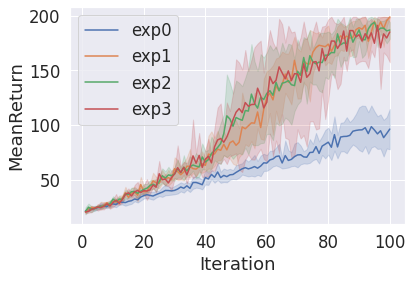

In [26]:
plot(['cartpole_PG_0', 'cartpole_PG_1', 'cartpole_PG_2', 'cartpole_PG_3'], legend=["exp0","exp1","exp2","exp3"],value='MeanReturn')

*Your answer*

- `exp0` has both `reward-to-go` and `normalize-advantage` set to false
- `exp1` has `reward-to-go` set to True and `normalize-advantage` set to false
- `exp2` has `reward-to-go` set to False and `normalize-advantage` set to True
- `exp3` has both `reward-to-go` and `normalize-advantage` set to True

This show the impotance of using `reward-to-go` and `normalize-advantage`, but despite we could await better result using both, our result shown that using both of them separatly give as good as a result as using both of them together.

**Question 2.2**

Plot a graph that compares the performance of two different experiments in the lunar-continuous environment, one with and one without the baseline. Are the results expected? If you choose the recommended parameters, you should reach rewards of around 100, and one experiment should take around 20 minutes. Do not run the experiment without the baseline yourself, use the results from the folder lunar-continuous_PG_0 instead.

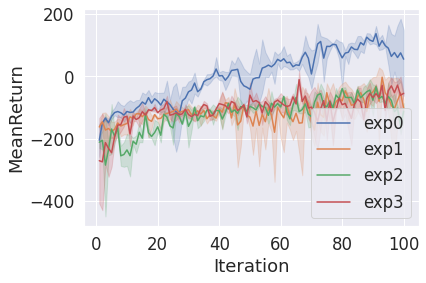

In [35]:
plot(['lunar-continuous_PG_0', 'lunar-continuous_PG_1', 'lunar-continuous_PG_2', 'lunar-continuous_PG_3'], legend=["exp0","exp1", 'exp2', 'exp3'],value='MeanReturn')

*Your answer*

# 3 Q-learning

### DQN implementation (your code for question 3.2 goes here)

In [59]:
class DQN(OffPolicyAgent):
    def __init__(self, env, device, q_fun, batch_size=64, learning_starts=1000, learning_freq=4, replay_buffer_size=50000, max_path_frames=np.inf,
                 discount_factor=0.99, exploration=None, sync_every=3000, double_q=False, alternative_car_reward=False
        ):
        super(DQN, self).__init__(env, device, batch_size, learning_starts, learning_freq, replay_buffer_size, max_path_frames)
        self.double_q = double_q
        self.exploration = exploration
        self.gamma = discount_factor

        # q function network
        self.q_fun = q_fun
        self.q_fun.to_(self.device)
        self.q_fun.sync_target()

        # utilities for target updates (sync every x iterations)
        self._num_updates = 0
        self.sync_every = sync_every

        # alternative car reward
        self.alternative_car_reward = alternative_car_reward

    @torch.no_grad()
    def act(self, ob, eval=False):
        if not eval and (self._frame < self.learning_starts or random.random() < self.exploration.value(self._frame)):
            ac = self.env.action_space.sample()
        else:
            ac = self._exploit(ob, eval)
        return ac

    def _exploit(self, ob, eval):
        ob = self.env.process_state(ob)
        q = self.q_fun.forward(ob, eval=eval)
        ac = torch.argmax(q, axis=1)
        return self.env.process_action(ac)

    def update(self):
        self._update()
        self._num_updates += 1

        # periodically update the target network
        if self._num_updates % self.sync_every == 0:
            self.q_fun.sync_target()

    def _update(self):
        # sample transitions from buffer
        data = self.replay_buffer.sample(self.batch_size)
        states = data['states']					              # shape (N, ob_dim)
        next_states = data['next_states']		          # shape (N, ob_dim)
        actions = data['actions'].long().view(-1, 1)  # shape (N, 1)
        rewards = data['rewards']				              # shape (N, 1)
        done_mask = data['done_mask']  			          # shape (N, 1)

        # modify reward for the car environment
        if self.alternative_car_reward:
            for i, (state, next_state) in enumerate(zip(states, next_states)):
                rewards[i] = 100*((math.sin(3*next_state[0]) * 0.0025 + 0.5 * next_state[1] * next_state[1]) - (math.sin(3*state[0]) * 0.0025 + 0.5 * state[1] * state[1]))

        # compute q values
        q_values = self.q_fun.net(states).gather(1, actions)	# shape (N, 1)

        # compute targets
        with torch.no_grad():
            if not self.double_q:
                q_targets_next = self.q_fun.target_net(next_states).max(1, keepdim=True)[0]  # shape (N, 1)
            else:
                q_tmp = self.q_fun.net(next_states)
                best_actions = torch.argmax(q_tmp, axis=1, keepdim=True)
                q_targets_next = self.q_fun.target_net(next_states).gather(1, best_actions) 
            q_targets = rewards + (1 - done_mask) * self.gamma * q_targets_next

        # compute loss and update network
        loss = F.smooth_l1_loss(q_values, q_targets)
        self.q_fun.optimize(loss)

### Training (run experiments for questions 3.1 and 3.2)

Select an environment and a set of hyper-parameters. Don't forget to set a unique name for each experiment you do.

In [57]:
# name your experiment
exp_name = 'myexp'

# choose the environment
env_names = ['cartpole', 'lunar', 'car']
env_name = env_names[1]

# define the training parameters
max_training_frames = 150000        # use 150000 for car, 300000 for lunar
max_training_iterations = np.inf        

# define the network parameters for the q-function
net_params = {
    'q_lr': 0.005,
    'q_hidden': [64],     # use [64] for car, [64, 64] for lunar
}

# define the algorithm parameters
alg_params = {
    'batch_size': 32,         # use 32 for car, lunar 
    'learning_starts': 1000,  # use 1000 for car, lunar (update the model for the first time after collecting at least x frames)
    'learning_freq': 1,       # (collect x frames between each model update)
    'discount_factor': 0.95,  # use 0.95 for car, 1.00 for lunar
    'sync_every': 3000,       # use 3000 for car, lunar (sync the target network every x iterations)
    'double_q': True,        # question 3.2
    'max_path_frames': 10000,
    'replay_buffer_size': 50000,  # use 50000 for car, lunar
    'alternative_car_reward': False, # question 3.1
}

# exploration strategy (you don't have to change this)
time2 = max_training_frames * 0.1
exploration = PiecewiseSchedule(
    [(0, 1), (time2, 0.02)],   # waypoints: exploration threshold decreases linearly from value1 at time1 to value2 at time2, then stays at outside_value
    outside_value=0.02)

# set up the logging directory (you don't have to change this)
logdir = setup_dir('experiments/' + env_name + '_DQN_', {**net_params, **alg_params, **{'exp_name': exp_name}})
tbdir = os.path.join(logdir, 'runs')
cur_run = 0

Logging data to experiments/lunar_DQN_3/log.txt


If you want, run this cell to monitor the training in real time. BestMeanReturn, MeanReturn and EvalMeanReturn are the most important stats to monitor.

In [ ]:
%tensorboard --logdir  $tbdir

Launch a training session. You can run it more than once by setting num_runs > 1 or by running the cell several times. Different runs from the same experiment will be averaged together when plotting the results.

In [60]:
EVAL_INTERVAL = 20000
LOG_INTERVAL = 1000
num_runs = 1

for _ in range(num_runs):
    env = GymEnv(env_name, device)
    agent = dqn_agent(env, net_params, alg_params, exploration)
    writer = SummaryWriter(os.path.join(tbdir, str(cur_run)))
    cur_run += 1
    train(agent, max_training_frames, max_training_iterations, EVAL_INTERVAL, LOG_INTERVAL, logdir, writer)
    env.close()

********** Iteration 1000 ************
-------------------------------------
|       Iteration |           1e+03 |
|            Time |          0.0331 |
|       Timesteps |           2e+03 |
|      MeanReturn |            -150 |
|  BestMeanReturn |            -inf |
|        Episodes |              19 |
|     Exploration |           0.869 |
-------------------------------------
********** Iteration 2000 ************
-------------------------------------
|       Iteration |           2e+03 |
|            Time |          0.0616 |
|       Timesteps |           3e+03 |
|      MeanReturn |            -162 |
|  BestMeanReturn |            -inf |
|        Episodes |              27 |
|     Exploration |           0.804 |
-------------------------------------
********** Iteration 3000 ************
-------------------------------------
|       Iteration |           3e+03 |
|            Time |          0.0913 |
|       Timesteps |           4e+03 |
|      MeanReturn |            -151 |
|  BestMe

********** Iteration 21000 ************
-------------------------------------
|       Iteration |         2.1e+04 |
|            Time |            1.12 |
|       Timesteps |         2.2e+04 |
|      MeanReturn |            -125 |
|  BestMeanReturn |            -inf |
|        Episodes |              80 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 22000 ************
-------------------------------------
|       Iteration |         2.2e+04 |
|            Time |            1.16 |
|       Timesteps |         2.3e+04 |
|      MeanReturn |            -122 |
|  BestMeanReturn |            -inf |
|        Episodes |              82 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 23000 ************
-------------------------------------
|       Iteration |         2.3e+04 |
|            Time |            1.22 |
|       Timesteps |         2.4e+04 |
|      MeanReturn |            -122 |
|  Bes

********** Iteration 41000 ************
-------------------------------------
|       Iteration |         4.1e+04 |
|            Time |            2.77 |
|       Timesteps |         4.2e+04 |
|      MeanReturn |            -122 |
|  BestMeanReturn |            -122 |
|        Episodes |             101 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 42000 ************
-------------------------------------
|       Iteration |         4.2e+04 |
|            Time |            2.82 |
|       Timesteps |         4.3e+04 |
|      MeanReturn |            -121 |
|  BestMeanReturn |            -121 |
|        Episodes |             102 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 43000 ************
-------------------------------------
|       Iteration |         4.3e+04 |
|            Time |            2.87 |
|       Timesteps |         4.4e+04 |
|      MeanReturn |            -121 |
|  Bes

********** Iteration 61000 ************
-------------------------------------
|       Iteration |         6.1e+04 |
|            Time |            4.14 |
|       Timesteps |         6.2e+04 |
|      MeanReturn |            -108 |
|  BestMeanReturn |            -108 |
|        Episodes |             130 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 62000 ************
-------------------------------------
|       Iteration |         6.2e+04 |
|            Time |            4.19 |
|       Timesteps |         6.3e+04 |
|      MeanReturn |            -107 |
|  BestMeanReturn |            -107 |
|        Episodes |             131 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 63000 ************
-------------------------------------
|       Iteration |         6.3e+04 |
|            Time |            4.25 |
|       Timesteps |         6.4e+04 |
|      MeanReturn |            -108 |
|  Bes

********** Iteration 81000 ************
-------------------------------------
|       Iteration |         8.1e+04 |
|            Time |            5.29 |
|       Timesteps |         8.2e+04 |
|      MeanReturn |           -98.8 |
|  BestMeanReturn |           -96.9 |
|        Episodes |             155 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 82000 ************
-------------------------------------
|       Iteration |         8.2e+04 |
|            Time |            5.33 |
|       Timesteps |         8.3e+04 |
|      MeanReturn |            -100 |
|  BestMeanReturn |           -96.9 |
|        Episodes |             157 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 83000 ************
-------------------------------------
|       Iteration |         8.3e+04 |
|            Time |            5.38 |
|       Timesteps |         8.4e+04 |
|      MeanReturn |            -100 |
|  Bes

********** Iteration 101000 ************
-------------------------------------
|       Iteration |        1.01e+05 |
|            Time |            6.85 |
|       Timesteps |        1.02e+05 |
|      MeanReturn |            -107 |
|  BestMeanReturn |           -96.9 |
|        Episodes |             182 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 102000 ************
-------------------------------------
|       Iteration |        1.02e+05 |
|            Time |             6.9 |
|       Timesteps |        1.03e+05 |
|      MeanReturn |            -107 |
|  BestMeanReturn |           -96.9 |
|        Episodes |             183 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 103000 ************
-------------------------------------
|       Iteration |        1.03e+05 |
|            Time |            6.95 |
|       Timesteps |        1.04e+05 |
|      MeanReturn |            -107 |
|  

********** Iteration 121000 ************
-------------------------------------
|       Iteration |        1.21e+05 |
|            Time |            8.44 |
|       Timesteps |        1.22e+05 |
|      MeanReturn |           -98.1 |
|  BestMeanReturn |           -96.9 |
|        Episodes |             204 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 122000 ************
-------------------------------------
|       Iteration |        1.22e+05 |
|            Time |            8.49 |
|       Timesteps |        1.23e+05 |
|      MeanReturn |           -96.8 |
|  BestMeanReturn |           -96.8 |
|        Episodes |             205 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 123000 ************
-------------------------------------
|       Iteration |        1.23e+05 |
|            Time |            8.56 |
|       Timesteps |        1.24e+05 |
|      MeanReturn |           -96.9 |
|  

********** Iteration 141000 ************
-------------------------------------
|       Iteration |        1.41e+05 |
|            Time |              10 |
|       Timesteps |        1.42e+05 |
|      MeanReturn |           -93.5 |
|  BestMeanReturn |           -92.5 |
|        Episodes |             226 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 142000 ************
-------------------------------------
|       Iteration |        1.42e+05 |
|            Time |            10.1 |
|       Timesteps |        1.43e+05 |
|      MeanReturn |           -92.7 |
|  BestMeanReturn |           -92.5 |
|        Episodes |             227 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 143000 ************
-------------------------------------
|       Iteration |        1.43e+05 |
|            Time |            10.1 |
|       Timesteps |        1.44e+05 |
|      MeanReturn |           -91.5 |
|  

### Assignment

**Question 3.1**

Plot a graph that compares the performance of two different experiments in the car environment, one with the original reward and one with the alternative reward.  Are the results expected? If you choose the recommended parameters, you should reach decent original rewards when training from the alternative rewards, and one experiment should take around 10 minutes. Do not run the experiment with the original reward yourself, use the results from the folder car_DQN_0 instead. Note that the logs always report the original rewards. 

Other than changing the reward function, which feels a bit like cheating, we could improve the exploration strategy. What do you think might help with the original problem (you don't have to implement it)?


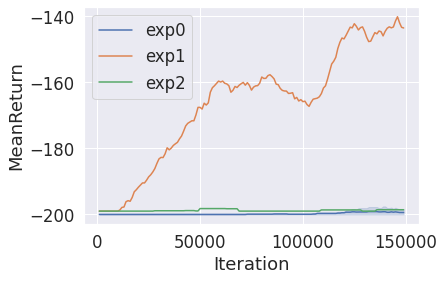

In [44]:
plot(['car_DQN_0', 'car_DQN_1', 'car_DQN_2'], legend=['exp0', 'exp1', 'exp2'], value='MeanReturn')

*Your answer*

**Question 3.2**

First, you should complete the code in the 'DQN implementation' cell. Plot a graph that compares the performance of two different experiments in the lunar environment, one with and one without double DQN. Are the results expected? If you choose the recommended parameters, you should reach rewards of around 150, and one experiment should take around 20 minutes. Do not run the experiment without DDQN yourself, use the results from the folder lunar_DQN_0 instead.

(Optional) In the previous section you have seen a policy gradient algorithm, which converges in theory (although usually to local optima). DQN doesn't have such guarantees. Can you imagine why? Aren't we doing gradient descent in both cases?


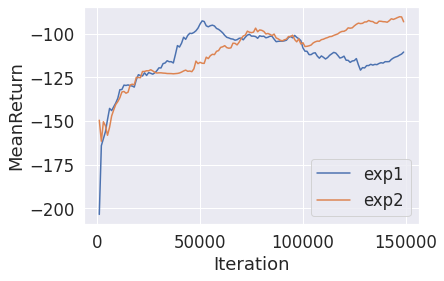

In [62]:
plot(['lunar_DQN_1', 'lunar_DQN_3'], legend=['exp1', 'exp2'], value='MeanReturn')

*Your answer*

Plot a graph (with x='Episodes') that compares the performance of DQN against Reinforce in the discrete lunar environment. Which was more sample efficient? Why? Do not run the Reinforce experiment yourself, use the results from the folder lunar_PG_0 instead. 

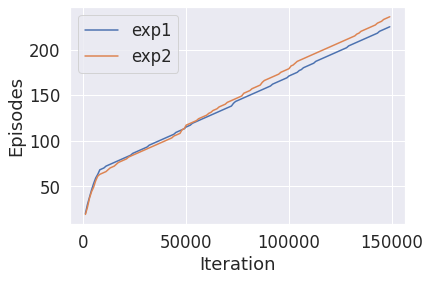

In [63]:
plot(['lunar_DQN_1', 'lunar_DQN_3'], legend=['exp1', 'exp2'], value='Episodes')

*Your answer*

# 4 Actor-Critic

### DDPG implementation (your code for question 4.1 goes here)

In [74]:
class DDPG(OffPolicyAgent):
    def __init__(self, env, device, policy, q_fun, batch_size=64, learning_starts=1000, learning_freq=4, replay_buffer_size=50000, max_path_frames=np.inf,
                 discount_factor=0.99, exploration_noise=0.1, sync_every=5, 
        ):
        super(DDPG, self).__init__(env, device, batch_size, learning_starts, learning_freq, replay_buffer_size, max_path_frames)
        self.gamma = discount_factor
        self.exploration = exploration_noise

        # policy network
        self.policy = policy
        self.policy.to_(self.device)
        self.policy.sync_target()

        # q function network
        self.q_fun = q_fun
        self.q_fun.to_(self.device)
        self.q_fun.sync_target()

        # utilities for target updates (sync every x iterations)
        self._num_updates = 0
        self.sync_every = sync_every

    @torch.no_grad()
    def act(self, ob, eval=False):
        if not eval and self._frame < self.learning_starts:
            ac = self.env.action_space.sample()
        else:
            ac = self._exploit(ob, eval)
            ac_noise = self.exploration.value(self._frame)
            if not eval and ac_noise != 0:
                ac = ac + np.random.normal(0, ac_noise, size=self.env.action_dim)
                ac = ac.clip(self.env.min_action, self.env.max_action)
        return ac

    def _exploit(self, ob, eval):
        ob = self.env.process_state(ob)
        ac = self.policy.forward(ob, eval=eval)
        return self.env.process_action(ac)

    def update(self):
        self._update()
        self._num_updates += 1

        # periodically update the target network
        if self._num_updates % self.sync_every == 0:
            self.q_fun.sync_target()
            self.policy.sync_target()

    def _update(self):
        # sample transitions from buffer
        data = self.replay_buffer.sample(self.batch_size)
        states = data['states']					        # shape (N, ob_dim)
        next_states = data['next_states']		    # shape (N, ob_dim)
        actions = data['actions']	              # shape (N, ac_dim)
        rewards = data['rewards']				        # shape (N, 1)
        done_mask = data['done_mask']  			    # shape (N, 1)

        # update the critic
        q_values = self.q_fun.net(states, actions)      # shape (N, 1)
        
        with torch.no_grad():
            q_targets_next = self.q_fun.target_net(next_states, self.policy.target_net(next_states))
            q_targets = rewards + (1-done_mask)*self.gamma*q_targets_next

        critic_loss = F.smooth_l1_loss(q_values, q_targets)

        self.q_fun.optimize(critic_loss)

        # update the actor
        self._update_actor(states)

    def _update_actor(self, states):
        # temporally freeze q-network 
        for p in self.q_fun.net.parameters():
            p.requires_grad = False

        # compute loss and update network
        greedy_actions = self.policy.net(states)
        actor_loss = self.q_fun.net(states, greedy_actions).mean()
        self.policy.optimize(actor_loss)

        # unfreeze q-network
        for p in self.q_fun.net.parameters():
            p.requires_grad = True

### Training (run experiments for question 4.1)

Select an environment and a set of hyper-parameters. Don't forget to set a unique name for each experiment you do.

In [64]:
# name your experiment
exp_name = 'myexp'

# choose the environment
env_names = ['pendulum', 'lunar-continuous', 'car-continuous']
env_name = env_names[0]

# define the training parameters
max_training_frames = 200000
max_training_iterations = np.inf        

# define the network parameters for the policy and q-function
net_params = {
    'q_lr': 0.005,
    'policy_lr': 0.0005,
    'q_hidden': [64, 64],
    'policy_hidden': [64, 64],
}

# define the algorithm parameters
alg_params = {
    'batch_size': 32,
    'learning_starts': 1000,
    'learning_freq': 1,
    'discount_factor': 0.99,
    'sync_every': 3000,
    'max_path_frames': 10000,
    'replay_buffer_size': 50000,
}

# exploration noise
time2 = max_training_frames * 0.1
exploration = PiecewiseSchedule(
    [(0, 0.5), (time2, 0.02)],
    outside_value=0.02)

# set up the logging directory (you don't have to change this)
logdir = setup_dir('experiments/' + env_name + '_DDPG_', {**net_params, **alg_params, **{'exp_name': exp_name}})
tbdir = os.path.join(logdir, 'runs')
cur_run = 0

Logging data to experiments/pendulum_DDPG_0/log.txt


If you want, run this cell to monitor the training in real time. BestMeanReturn, MeanReturn and EvalMeanReturn are the most important stats to monitor.

In [ ]:
%tensorboard --logdir  $tbdir

Launch a training session. You can run it more than once by setting num_runs > 1 or by running the cell several times. Different runs from the same experiment will be averaged together when plotting the results.

In [75]:
EVAL_INTERVAL = 20000
LOG_INTERVAL = 1000
num_runs = 1

for _ in range(num_runs):
    env = GymEnv(env_name, device)
    agent = ddpg_agent(env, net_params, alg_params, exploration)
    writer = SummaryWriter(os.path.join(tbdir, str(cur_run)))
    cur_run += 1
    train(agent, max_training_frames, max_training_iterations, EVAL_INTERVAL, LOG_INTERVAL, logdir, writer)
    env.close()

********** Iteration 1000 ************
-------------------------------------
|       Iteration |           1e+03 |
|            Time |          0.0615 |
|       Timesteps |           2e+03 |
|      MeanReturn |       -1.31e+03 |
|  BestMeanReturn |            -inf |
|        Episodes |              10 |
|     Exploration |           0.452 |
-------------------------------------
********** Iteration 2000 ************
-------------------------------------
|       Iteration |           2e+03 |
|            Time |           0.121 |
|       Timesteps |           3e+03 |
|      MeanReturn |       -1.28e+03 |
|  BestMeanReturn |            -inf |
|        Episodes |              15 |
|     Exploration |           0.428 |
-------------------------------------
********** Iteration 3000 ************
-------------------------------------
|       Iteration |           3e+03 |
|            Time |           0.179 |
|       Timesteps |           4e+03 |
|      MeanReturn |       -1.27e+03 |
|  BestMe

********** Iteration 21000 ************
-------------------------------------
|       Iteration |         2.1e+04 |
|            Time |            1.36 |
|       Timesteps |         2.2e+04 |
|      MeanReturn |       -1.56e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             110 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 22000 ************
-------------------------------------
|       Iteration |         2.2e+04 |
|            Time |            1.42 |
|       Timesteps |         2.3e+04 |
|      MeanReturn |       -1.59e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             115 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 23000 ************
-------------------------------------
|       Iteration |         2.3e+04 |
|            Time |            1.48 |
|       Timesteps |         2.4e+04 |
|      MeanReturn |       -1.61e+03 |
|  Bes

********** Iteration 41000 ************
-------------------------------------
|       Iteration |         4.1e+04 |
|            Time |            2.67 |
|       Timesteps |         4.2e+04 |
|      MeanReturn |       -1.77e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             211 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 42000 ************
-------------------------------------
|       Iteration |         4.2e+04 |
|            Time |            2.72 |
|       Timesteps |         4.3e+04 |
|      MeanReturn |       -1.77e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             216 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 43000 ************
-------------------------------------
|       Iteration |         4.3e+04 |
|            Time |            2.78 |
|       Timesteps |         4.4e+04 |
|      MeanReturn |       -1.78e+03 |
|  Bes

********** Iteration 61000 ************
-------------------------------------
|       Iteration |         6.1e+04 |
|            Time |            3.97 |
|       Timesteps |         6.2e+04 |
|      MeanReturn |       -1.75e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             311 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 62000 ************
-------------------------------------
|       Iteration |         6.2e+04 |
|            Time |            4.03 |
|       Timesteps |         6.3e+04 |
|      MeanReturn |       -1.75e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             316 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 63000 ************
-------------------------------------
|       Iteration |         6.3e+04 |
|            Time |            4.09 |
|       Timesteps |         6.4e+04 |
|      MeanReturn |       -1.74e+03 |
|  Bes

********** Iteration 81000 ************
-------------------------------------
|       Iteration |         8.1e+04 |
|            Time |            5.34 |
|       Timesteps |         8.2e+04 |
|      MeanReturn |       -1.75e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             412 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 82000 ************
-------------------------------------
|       Iteration |         8.2e+04 |
|            Time |            5.41 |
|       Timesteps |         8.3e+04 |
|      MeanReturn |       -1.76e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             417 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 83000 ************
-------------------------------------
|       Iteration |         8.3e+04 |
|            Time |            5.48 |
|       Timesteps |         8.4e+04 |
|      MeanReturn |       -1.76e+03 |
|  Bes

********** Iteration 101000 ************
-------------------------------------
|       Iteration |        1.01e+05 |
|            Time |            6.77 |
|       Timesteps |        1.02e+05 |
|      MeanReturn |       -1.75e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             512 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 102000 ************
-------------------------------------
|       Iteration |        1.02e+05 |
|            Time |            6.84 |
|       Timesteps |        1.03e+05 |
|      MeanReturn |       -1.75e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             517 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 103000 ************
-------------------------------------
|       Iteration |        1.03e+05 |
|            Time |             6.9 |
|       Timesteps |        1.04e+05 |
|      MeanReturn |       -1.75e+03 |
|  

********** Iteration 121000 ************
-------------------------------------
|       Iteration |        1.21e+05 |
|            Time |            8.21 |
|       Timesteps |        1.22e+05 |
|      MeanReturn |       -1.75e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             613 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 122000 ************
-------------------------------------
|       Iteration |        1.22e+05 |
|            Time |            8.28 |
|       Timesteps |        1.23e+05 |
|      MeanReturn |       -1.74e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             618 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 123000 ************
-------------------------------------
|       Iteration |        1.23e+05 |
|            Time |            8.34 |
|       Timesteps |        1.24e+05 |
|      MeanReturn |       -1.74e+03 |
|  

********** Iteration 141000 ************
-------------------------------------
|       Iteration |        1.41e+05 |
|            Time |            9.66 |
|       Timesteps |        1.42e+05 |
|      MeanReturn |        -1.8e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             713 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 142000 ************
-------------------------------------
|       Iteration |        1.42e+05 |
|            Time |            9.73 |
|       Timesteps |        1.43e+05 |
|      MeanReturn |       -1.81e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             718 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 143000 ************
-------------------------------------
|       Iteration |        1.43e+05 |
|            Time |            9.79 |
|       Timesteps |        1.44e+05 |
|      MeanReturn |       -1.81e+03 |
|  

********** Iteration 161000 ************
-------------------------------------
|       Iteration |        1.61e+05 |
|            Time |            11.1 |
|       Timesteps |        1.62e+05 |
|      MeanReturn |       -1.81e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             814 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 162000 ************
-------------------------------------
|       Iteration |        1.62e+05 |
|            Time |            11.2 |
|       Timesteps |        1.63e+05 |
|      MeanReturn |       -1.81e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             819 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 163000 ************
-------------------------------------
|       Iteration |        1.63e+05 |
|            Time |            11.3 |
|       Timesteps |        1.64e+05 |
|      MeanReturn |       -1.81e+03 |
|  

********** Iteration 181000 ************
-------------------------------------
|       Iteration |        1.81e+05 |
|            Time |            12.6 |
|       Timesteps |        1.82e+05 |
|      MeanReturn |       -1.82e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             914 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 182000 ************
-------------------------------------
|       Iteration |        1.82e+05 |
|            Time |            12.7 |
|       Timesteps |        1.83e+05 |
|      MeanReturn |       -1.82e+03 |
|  BestMeanReturn |       -1.55e+03 |
|        Episodes |             919 |
|     Exploration |            0.02 |
-------------------------------------
********** Iteration 183000 ************
-------------------------------------
|       Iteration |        1.83e+05 |
|            Time |            12.7 |
|       Timesteps |        1.84e+05 |
|      MeanReturn |       -1.82e+03 |
|  

### Assignment

**Question 4.1**

First, you should complete the code in the 'DDPG implementation' cell. If you have time, plot a graph of an experiment. For instance, you can compare DDPG to Reinforce in the lunar-continuous environment or the pendulum environment. Did it reach higher rewards (for comparable training times)?

In [ ]:
# PLOT GRAPH

*Your answer*